# RETAIL DEMAND PREDICTION

**Problem Statement:** In order to prevent the over/under stocking situation in the inventory we need to predict the demands for a Retailer based on the historical data provided.

**Datasets Available:** We have three datasets at hand. 
1. train.csv: This is the total transactional data that includes details like which product was sold in what quantity at which store.
2. product_data.csv: This is a table that describes the details of each product in the inventory; such as: product category, product size, manufacturer.
3. store.csv: This is a table that describes details of each store such as store city, state, average basket size, store segmentation.

Let's load the necessary libraries, datasets and have a look at the data.

## 1. Loading Datasets

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import datetime
import random

%matplotlib inline
warnings.filterwarnings('ignore')

In [2]:
train_df = pd.read_csv('train.csv')
product_df = pd.read_csv('product_data.csv')
store_df = pd.read_csv('store_data.csv')

### (A) train_df
We have a total of 232287 purchase records and the details are captured in 8 columns. these columns are:

1. **WEEK_END_DATE:** Describes the last date of the week in which a particular transcation was made. 
2. **STORE_NUM:** Unique identifire for the store where the transaction was carried out. Described as 'Int' datatype, we need to convert it to Categorical datatype.
3. **UPC:** Unique Identifier for the product that was sold. Described as 'Int' datatype, we need to convert it to Categorical datatype.
4. **BASE_PRICE:** Price of the product sold.
5. **FEATURE:** If the product was featured in the In-store circular.
6. **DISPLAY:** If the product was part of in-store promotional display.
7. **UNITS:** The number of units sold in the transaction (Target Variable).

### (B) product_df
We have a total of 30 Unique products and their details are captured in 6 columns. these columns are:

1. **UPC:** Unique identifire for each product (Universal Product Code).
2. **DESCRIPTION:** desription of the product
3. **MANUFACTURER:** The company that manufactured the particular product.
4. **CATEGORY:** The category that product falls under.
5. **SUB_CATEGORY:** The sub-category of the category that product belongs to.
6. **PRODUCT_SIZE:** The package size/quantity of the product.

### (C) store_df
We have a total of 76 Unique stores and their details are captured in 9 columns. these columns are:

1. **STORE_ID:** Unique identifire for each store.
2. **STORE_NAME:** Name of store.
3. **ADDRESS_CITY_NAME:** City where the store is located.
4. **MSA_CODE:** (Metropolitan Statistical Area) Based on geographic region and population density of the area where store is located in.
5. **SEG_VALUE_NAME:** Store Segment Name.
6. **PARKING_SPACE_QTY:** The number of parking spots available at the store. (Higher values indicate the customer-footfall is higher.) 
7. **SALES_AREA_SIZE_NUM:** The sales area (sq. feet) of the store.
6. **AVG_WEEKLY_BASKETS:** The average number of orders a store recives each week.

## 2. Uderstanding and Validating Data
### (A). train_df

In [3]:
train_df.head()

,WEEK_END_DATE,STORE_NUM,UPC,PRICE,BASE_PRICE,FEATURE,DISPLAY,UNITS
0,14-Jan-09,367,1111009477,1.39,1.57,0,0,13
1,14-Jan-09,367,1111009497,1.39,1.39,0,0,20
2,14-Jan-09,367,1111085319,1.88,1.88,0,0,14
3,14-Jan-09,367,1111085345,1.88,1.88,0,0,29
4,14-Jan-09,367,1111085350,1.98,1.98,0,0,35


In [4]:
train_df.shape

(232287, 8)

In [5]:
train_df.isnull().sum()

WEEK_END_DATE     0
STORE_NUM         0
UPC               0
PRICE             3
BASE_PRICE       12
FEATURE           0
DISPLAY           0
UNITS             0
dtype: int64

In [6]:
train_df.dtypes

WEEK_END_DATE     object
STORE_NUM          int64
UPC                int64
PRICE            float64
BASE_PRICE       float64
FEATURE            int64
DISPLAY            int64
UNITS              int64
dtype: object

1. WEEK_END_DATE: Described as 'Object' datatype, We need to convert it to Datetime datatype and we can extract further details from this column.
2. STORE_NUM, UPC: Described as 'Int' datatype, We need to convert it to 'Category' datatype as they represent categorical values.
3. FEATURE, DISPLAY: Described as 'Int' datatype, We need to convert it to 'Category' datatype as these two also represent categorical information.

In [7]:
train_df['WEEK_END_DATE'] = pd.to_datetime(train_df['WEEK_END_DATE'])
train_df['STORE_NUM'] = train_df['STORE_NUM'].astype('category')
train_df['UPC'] = train_df['UPC'].astype('category')

**1. WEEK_END_DATE**
* **What is the Start and End date of the data?**

In [8]:
train_df['WEEK_END_DATE'].max(), train_df['WEEK_END_DATE'].min()

(Timestamp('2011-09-28 00:00:00'), Timestamp('2009-01-14 00:00:00'))

The starting Date is 14th January 2009 and End Date is 28th September 2011.

* **What is the total duration of the data in weeks?**

In [9]:
(train_df['WEEK_END_DATE'].max()-train_df['WEEK_END_DATE'].min())/7

Timedelta('141 days 00:00:00')

In [10]:
train_df['WEEK_END_DATE'].nunique()

142

We see the data is spanned over a period of 142 weeks.
* **Are all dates at a gap of 1 Week?**

In [11]:
train_df['WEEK_END_DATE'].dt.day_name().value_counts()

Wednesday    232287
Name: WEEK_END_DATE, dtype: int64

for all the data-points the data is captured on Wednesday of week. Since there's no other day present in the day_name feature, this proves that there's a consistency in capturing the data at the gap of 1 week.

**2. STORE_NUM**

In [12]:
train_df.head()

,WEEK_END_DATE,STORE_NUM,UPC,PRICE,BASE_PRICE,FEATURE,DISPLAY,UNITS
0,2009-01-14,367,1111009477,1.39,1.57,0,0,13
1,2009-01-14,367,1111009497,1.39,1.39,0,0,20
2,2009-01-14,367,1111085319,1.88,1.88,0,0,14
3,2009-01-14,367,1111085345,1.88,1.88,0,0,29
4,2009-01-14,367,1111085350,1.98,1.98,0,0,35


In [13]:
train_df['STORE_NUM'].value_counts()

2513     4098
24991    3967
9825     3955
21237    3950
2277     3824
         ... 
15755    2253
11967    2104
2523     1977
23055    1823
8035     1676
Name: STORE_NUM, Length: 76, dtype: int64

We have a total of 76 different stores. Store No. 4098 has had the maximum number of orders while Store No. 8035 processed least number of orders.
* **Does each store sell atleast one item every week?**
* We have 76 stores selling products over a period of 142 weeks. If every week all the 76 stores made atleast one sale, then the total number of unique rows in the combination of WEEK_END_DATE and STORE_NUM should be 76X142 = 10792 rows. Let's check if this holds true

In [14]:
train_df[['WEEK_END_DATE', 'STORE_NUM']].drop_duplicates().shape

(10792, 2)

We have atleast 10792 unique values, this means every store is making atleast one sale per week.

**3. UPC**

* **Is every product sold atleast once a week?**

In [15]:
train_df['UPC'].nunique(), train_df['UPC'].value_counts()

(30,
 1600027527     10790
 1111085345     10789
 1600027528     10788
 1600027564     10786
 3800031838     10785
 1111085350     10775
 7192100339     10767
 3800039118     10766
 3800031829     10640
 1111085319     10636
 7192100337     10588
 1111009497     10498
 1111009477     10356
 1111087398      9989
 7192100336      9126
 2840004768      8488
 1111087395      8155
 1111087396      8131
 1111009507      8067
 2840004770      7636
 1111038078      7131
 7797502248      6916
 7218063052      3641
 31254742735     3202
 7797508006      2933
 1111038080      2797
 7797508004      2386
 31254742835     2086
 3700031613      1664
 3700044982       975
 Name: UPC, dtype: int64)

We have 30 different products sold over a period of 142 weeks. If Every product is sold atleast once every week then there should be 30X142 = 4260 unique rows in the combination of WEEK_END_DATE and UPC. Let's check if this holds true

In [16]:
train_df[['WEEK_END_DATE', 'UPC']].drop_duplicates().shape

(4260, 2)

Yes, every product is sold atleast once every week.
* **Is every store selling every product atleast once every week?**
* to check this, the total number of unique rows in the combinations of WEEK_END_DATE, UPC and STORE_NUM must be 142X30X76 = 323760, let's check if this holds true.

In [17]:
train_df[['WEEK_END_DATE', 'UPC', 'STORE_NUM']].drop_duplicates().shape

(232287, 3)

We only have a total of 232287 data-points, this means every store is not selling every product every week.

In [18]:
train_df.head()

,WEEK_END_DATE,STORE_NUM,UPC,PRICE,BASE_PRICE,FEATURE,DISPLAY,UNITS
0,2009-01-14,367,1111009477,1.39,1.57,0,0,13
1,2009-01-14,367,1111009497,1.39,1.39,0,0,20
2,2009-01-14,367,1111085319,1.88,1.88,0,0,14
3,2009-01-14,367,1111085345,1.88,1.88,0,0,29
4,2009-01-14,367,1111085350,1.98,1.98,0,0,35


In [19]:
train_df.groupby(['WEEK_END_DATE', 'STORE_NUM'])['UPC'].count().mean()

21.523999258710155

Every store sells an average of 22 products every week.

**4. BASE_PRICE**

In [20]:
train_df['BASE_PRICE'].describe()

count    232275.000000
mean          3.345204
std           1.678181
min           0.860000
25%           1.950000
50%           2.990000
75%           4.080000
max           7.890000
Name: BASE_PRICE, dtype: float64

The cheapest product has a price of 0.86 USD and the maximum price of any product is 7.89 USD. Average price is 3.34 USD and Median of Price is 2.99 USD, which indicates, there's no outlier present in this variable.

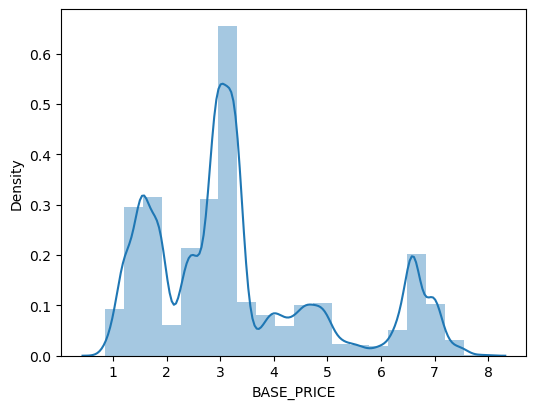

In [21]:
plt.figure(figsize=(6,4.5))
sns.distplot(train_df['BASE_PRICE'], bins=20, kde=True)
plt.show()

**5. FEATURE**

In [22]:
train_df['FEATURE'].value_counts(normalize = True)

0    0.900111
1    0.099889
Name: FEATURE, dtype: float64

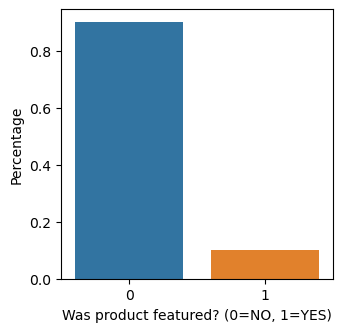

In [23]:
plt.figure(figsize = (3.5,3.5))
sns.barplot(x = train_df['FEATURE'].value_counts(normalize = True).index, y = train_df['FEATURE'].value_counts(normalize = True).values)
plt.xlabel('Was product featured? (0=NO, 1=YES)')
plt.ylabel('Percentage')
plt.show()

Approximately 10% of the products were featured when they were sold.

**6. DISPLAY**

In [24]:
train_df['DISPLAY'].value_counts(normalize = True)

0    0.864999
1    0.135001
Name: DISPLAY, dtype: float64

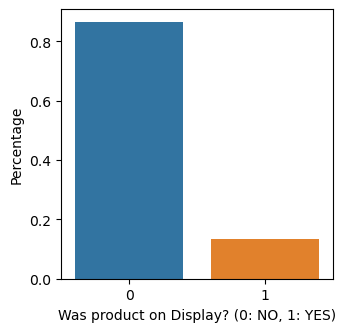

In [25]:
plt.figure(figsize = (3.5,3.5))
sns.barplot(x = train_df['DISPLAY'].value_counts(normalize = True).index, y = train_df['DISPLAY'].value_counts(normalize = True).values)
plt.xlabel('Was product on Display? (0: NO, 1: YES)')
plt.ylabel('Percentage')
plt.show()

Approximately 13.5% of the products sold were on display promotion.

In [26]:
pd.crosstab(train_df['DISPLAY'], train_df['FEATURE'])/len(train_df)

FEATURE,0,1
DISPLAY,,
0,0.821824,0.043175
1,0.078287,0.056714


82.18% of the times the product was neither featured nor on display promotion when it was sold while 5.67% products of the total sales were featured as well as on promotional display when they were sold.

**7. UNITS**

In [27]:
train_df['UNITS'].describe()

count    232287.000000
mean         28.063525
std          35.954341
min           0.000000
25%           9.000000
50%          18.000000
75%          34.000000
max        1800.000000
Name: UNITS, dtype: float64

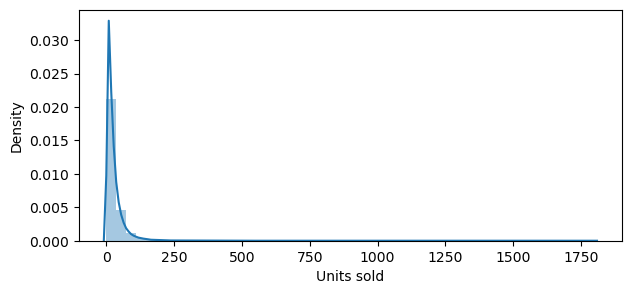

In [28]:
plt.figure(figsize = (7,3), dpi = 100)
sns.distplot(train_df['UNITS'])
plt.xlabel('Units sold')
plt.show()

Average number of units sold in each transaction is 28 units while the median is 18. Maximum number of units sold in one transcation are 1800 which clearly indicates the presence of outliers in the data. Minimum sold units are 0, let's have a look at the products that sold 0 units-

In [29]:
train_df[train_df['UNITS'] == 0]

,WEEK_END_DATE,STORE_NUM,UPC,PRICE,BASE_PRICE,FEATURE,DISPLAY,UNITS
76752,2009-12-02,28909,31254742735,NaN,4.99,0,0,0


There's only one such records, let's remove it from the dataset.

In [30]:
train_df = train_df[train_df['UNITS'] != 0]

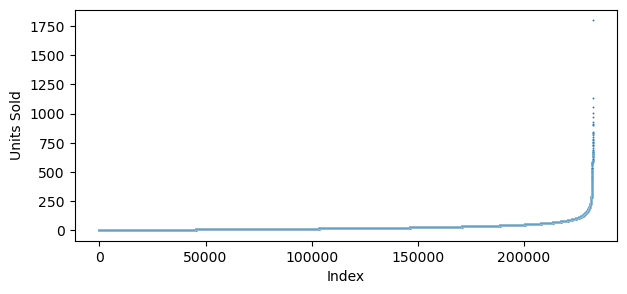

In [31]:
plt.figure(figsize = (7,3), dpi = 100)
sns.scatterplot(x = range(len(train_df)), y = train_df['UNITS'].sort_values(ascending = True), s=2)
plt.xlabel('Index')
plt.ylabel('Units Sold')
plt.show()

let's Log-transform the UNITS variable and see if the distribution gets closer to a normal distribution

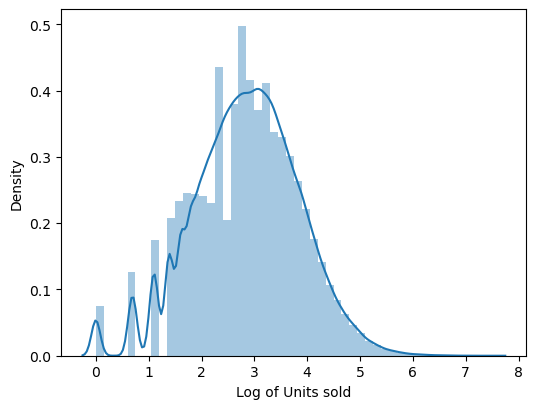

In [32]:
plt.figure(figsize = (6,4.5), dpi = 100)
sns.distplot(np.log(train_df['UNITS']))
plt.xlabel('Log of Units sold')
plt.show()

### (B). products_df

In [33]:
product_df.shape

(30, 6)

In [34]:
product_df.head()

,UPC,DESCRIPTION,MANUFACTURER,CATEGORY,SUB_CATEGORY,PRODUCT_SIZE
0,1111009477,PL MINI TWIST PRETZELS,PRIVATE LABEL,BAG SNACKS,PRETZELS,15 OZ
1,1111009497,PL PRETZEL STICKS,PRIVATE LABEL,BAG SNACKS,PRETZELS,15 OZ
2,1111009507,PL TWIST PRETZELS,PRIVATE LABEL,BAG SNACKS,PRETZELS,15 OZ
3,1111038078,PL BL MINT ANTSPTC RINSE,PRIVATE LABEL,ORAL HYGIENE PRODUCTS,MOUTHWASHES (ANTISEPTIC),500 ML
4,1111038080,PL ANTSPTC SPG MNT MTHWS,PRIVATE LABEL,ORAL HYGIENE PRODUCTS,MOUTHWASHES (ANTISEPTIC),500 ML


In [35]:
product_df.isnull().sum()

UPC             0
DESCRIPTION     0
MANUFACTURER    0
CATEGORY        0
SUB_CATEGORY    0
PRODUCT_SIZE    0
dtype: int64

In [36]:
product_df.dtypes

UPC              int64
DESCRIPTION     object
MANUFACTURER    object
CATEGORY        object
SUB_CATEGORY    object
PRODUCT_SIZE    object
dtype: object

**1. UPC**

* **Are all the UPCs in product_df same as UPCs in train_df?**

In [37]:
len(set(product_df['UPC']).intersection(set(train_df['UPC'])))

30

The length of product_df UPC's intersection set with the UPCs of train_df is also 30, which means all the UPCs in product_df are same as UPCs in train_df.

**2. CATEGORY**

In [38]:
product_df['CATEGORY'].nunique()

4

In [39]:
product_df['CATEGORY'].value_counts()

COLD CEREAL              9
BAG SNACKS               8
FROZEN PIZZA             7
ORAL HYGIENE PRODUCTS    6
Name: CATEGORY, dtype: int64

We have 4 Unique categories out of which: 
* 9 products belong to COLD CEREAL,
* 8 products belong to BAG SNACKS,
* 7 products belong to FROZEN PIZZA,
* 6 products belong to ORAL HYGIENE PRODUCTS

**3. SUB_CATEGORY**

In [40]:
product_df['SUB_CATEGORY'].nunique(), product_df['SUB_CATEGORY'].value_counts()

(7,
 PRETZELS                       8
 PIZZA/PREMIUM                  7
 ALL FAMILY CEREAL              6
 MOUTHWASHES (ANTISEPTIC)       5
 KIDS CEREAL                    2
 ADULT CEREAL                   1
 MOUTHWASH/RINSES AND SPRAYS    1
 Name: SUB_CATEGORY, dtype: int64)

We have 7 Sub categories. Let's see the category-wise division of sub_categories-

In [41]:
pd.DataFrame(product_df.groupby(['CATEGORY', 'SUB_CATEGORY'])['UPC'].count())

UPC
CATEGORY              SUB_CATEGORY                    
BAG SNACKS            PRETZELS                       8
COLD CEREAL           ADULT CEREAL                   1
                      ALL FAMILY CEREAL              6
                      KIDS CEREAL                    2
FROZEN PIZZA          PIZZA/PREMIUM                  7
ORAL HYGIENE PRODUCTS MOUTHWASH/RINSES AND SPRAYS    1
                      MOUTHWASHES (ANTISEPTIC)       5

* BAG SNACKS has only 1 SUB_CATEGORY- PRETZELS
* COLD CEREAL has 3 SUB_CATEGORIES- ADULT CEREAL, ALL FAMILY CEREAL, KIDS CEREAL
* FROZEN PIZZA has only 1 SUB_CATEGORY- PIZZA/PREMIUM
* ORAL HYGIENE PRODUCTS has 2 different SUB_CATEGORIES- MOUTHWASH/RINSES AND SPRAYS, MOUTHWASHES (ANTISEPTIC)

**4. PRODUCT_SIZE**

In [42]:
pd.DataFrame(product_df.groupby(['CATEGORY', 'SUB_CATEGORY', 'PRODUCT_SIZE'])['UPC'].count())

UPC
CATEGORY              SUB_CATEGORY                PRODUCT_SIZE     
BAG SNACKS            PRETZELS                    10 OZ           1
                                                  15 OZ           3
                                                  16 OZ           4
COLD CEREAL           ADULT CEREAL                20 OZ           1
                      ALL FAMILY CEREAL           12 OZ           1
                                                  12.25 OZ        2
                                                  18 OZ           3
                      KIDS CEREAL                 12.2 OZ         1
                                                  15 OZ           1
FROZEN PIZZA          PIZZA/PREMIUM               22.7 OZ         1
                                                  28.3 OZ         1
                                                  29.6 OZ         1
                                                  29.8 OZ         1
                                                  30.5 OZ         1
                                                  32.7 OZ         2
ORAL HYGIENE PRODUCTS MOUTHWASH/RINSES AND SPRAYS 1 LT            1
                      MOUTHWASHES (ANTISEPTIC)    1 LT            3
                                                  500 ML          2

We have a total of 18 different sizes available for products across all the categories. Category-wise description is as below:
* Bag Snacks has 1 Sub-category and 3 different sizes.
* Cold Cereal has 3 different sub categories out of which: Adult Cereal is available in one size, All-Family-Cereal is available in 3 different sizes, Kids Cereal is available in 2 different sizes.
* Frozen Pizza has 1 sub-category and is available in 6 different sizes.
* Oral-Hygiene-Products are available in 2 sub categories. Rinses/Sprays is available in one size while Antiseptic is available in 2 sizes.

**5. DESCRIPTION**

In [43]:
product_df['DESCRIPTION'].nunique()

29

For 30 products we have 29 different product descriptions, let's see what they are.

In [44]:
product_df['DESCRIPTION'].value_counts()

GM CHEERIOS                  2
PL MINI TWIST PRETZELS       1
SCOPE ORIG MINT MOUTHWASH    1
LSTRNE CL MINT ANTSPTC MW    1
SNYDR FF MINI PRETZELS       1
SNYDR SOURDOUGH NIBBLERS     1
SNYDR PRETZEL RODS           1
FRSC BRCK OVN ITL PEP PZ     1
DIGRN PEPP PIZZA             1
DIGRN SUPREME PIZZA          1
DIGIORNO THREE MEAT          1
KELL FROOT LOOPS             1
KELL FROSTED FLAKES          1
KELL BITE SIZE MINI WHEAT    1
CREST PH CLN MINT RINSE      1
RLDGLD PRETZEL STICKS        1
PL PRETZEL STICKS            1
RLDGLD TINY TWISTS PRTZL     1
GM HONEY NUT CHEERIOS        1
PL SR CRUST PEPPRN PIZZA     1
PL SR CRUST 3 MEAT PIZZA     1
PL SR CRUST SUPRM PIZZA      1
PL BT SZ FRSTD SHRD WHT      1
PL RAISIN BRAN               1
PL HONEY NUT TOASTD OATS     1
PL ANTSPTC SPG MNT MTHWS     1
PL BL MINT ANTSPTC RINSE     1
PL TWIST PRETZELS            1
LSTRNE FRS BRST ANTSPC MW    1
Name: DESCRIPTION, dtype: int64

In [45]:
product_df[product_df['DESCRIPTION'] == 'GM CHEERIOS']

,UPC,DESCRIPTION,MANUFACTURER,CATEGORY,SUB_CATEGORY,PRODUCT_SIZE
12,1600027528,GM CHEERIOS,GENERAL MI,COLD CEREAL,ALL FAMILY CEREAL,18 OZ
13,1600027564,GM CHEERIOS,GENERAL MI,COLD CEREAL,ALL FAMILY CEREAL,12 OZ


**6. MANUFACTURER**

In [46]:
product_df['MANUFACTURER'].nunique()

9

In [47]:
product_df['MANUFACTURER'].value_counts()

PRIVATE LABEL    11
GENERAL MI        3
KELLOGG           3
TOMBSTONE         3
SNYDER S          3
FRITO LAY         2
P & G             2
WARNER            2
TONYS             1
Name: MANUFACTURER, dtype: int64

We have 9 Different Manufacturers. Let's have a look at the categoy-wise manufacturers

In [48]:
pd.crosstab(product_df['CATEGORY'], product_df['MANUFACTURER'])

MANUFACTURER,FRITO LAY,GENERAL MI,KELLOGG,P & G,PRIVATE LABEL,SNYDER S,TOMBSTONE,TONYS,WARNER
CATEGORY,,,,,,,,,
BAG SNACKS,2,0,0,0,3,3,0,0,0
COLD CEREAL,0,3,3,0,3,0,0,0,0
FROZEN PIZZA,0,0,0,0,3,0,3,1,0
ORAL HYGIENE PRODUCTS,0,0,0,2,2,0,0,0,2


* Bag Snacks Category has 3 different players; Frito Lay, Private Label and Snyder's
* Cold Cereal has 3 different players; General MI, Kellogg and Private Label
* Frozen Pizza has 3 manufacturers; Private Label, Tomb Stone, Tony's
* Mouthwash is manufactured by 3 manufacturers; P&G, Private Label, Warner

### (C) store_df

In [49]:
store_df.shape

(76, 9)

In [50]:
store_df.head()

,STORE_ID,STORE_NAME,ADDRESS_CITY_NAME,ADDRESS_STATE_PROV_CODE,MSA_CODE,SEG_VALUE_NAME,PARKING_SPACE_QTY,SALES_AREA_SIZE_NUM,AVG_WEEKLY_BASKETS
0,367,15TH & MADISON,COVINGTON,KY,17140,VALUE,196.0,24721,12707
1,389,SILVERLAKE,ERLANGER,KY,17140,MAINSTREAM,408.0,46073,24767
2,613,EAST ALLEN,ALLEN,TX,19100,MAINSTREAM,464.0,64926,29386
3,623,HOUSTON,HOUSTON,TX,26420,MAINSTREAM,NaN,46930,36741
4,2277,ANDERSON TOWNE CTR,CINCINNATI,OH,17140,UPSCALE,NaN,81958,54053


In [51]:
store_df.dtypes

STORE_ID                     int64
STORE_NAME                  object
ADDRESS_CITY_NAME           object
ADDRESS_STATE_PROV_CODE     object
MSA_CODE                     int64
SEG_VALUE_NAME              object
PARKING_SPACE_QTY          float64
SALES_AREA_SIZE_NUM          int64
AVG_WEEKLY_BASKETS           int64
dtype: object

In [52]:
store_df.isnull().sum()

STORE_ID                    0
STORE_NAME                  0
ADDRESS_CITY_NAME           0
ADDRESS_STATE_PROV_CODE     0
MSA_CODE                    0
SEG_VALUE_NAME              0
PARKING_SPACE_QTY          51
SALES_AREA_SIZE_NUM         0
AVG_WEEKLY_BASKETS          0
dtype: int64

**1. STORE_ID**

In [53]:
store_df['STORE_ID'].nunique()

76

In [54]:
store_df['STORE_ID'].value_counts()

367      1
19533    1
23055    1
21485    1
21479    1
        ..
9825     1
8263     1
8041     1
8035     1
29159    1
Name: STORE_ID, Length: 76, dtype: int64

**2. STORE_NAME**

In [55]:
store_df['STORE_NAME'].nunique()

72

In [56]:
store_df['STORE_NAME'].value_counts()

HOUSTON            4
MIDDLETOWN         2
15TH & MADISON     1
DUNCANVILLE        1
WOOD FOREST S/C    1
                  ..
AT EASTEX FRWY     1
DENT               1
THE WOODLANDS      1
LANDEN             1
CARROLLTON         1
Name: STORE_NAME, Length: 72, dtype: int64

In [57]:
store_df[(store_df['STORE_NAME'] == 'HOUSTON') | (store_df['STORE_NAME'] == 'MIDDLETOWN')].sort_values(by = 'STORE_NAME')

,STORE_ID,STORE_NAME,ADDRESS_CITY_NAME,ADDRESS_STATE_PROV_CODE,MSA_CODE,SEG_VALUE_NAME,PARKING_SPACE_QTY,SALES_AREA_SIZE_NUM,AVG_WEEKLY_BASKETS
3,623,HOUSTON,HOUSTON,TX,26420,MAINSTREAM,NaN,46930,36741
9,2513,HOUSTON,HOUSTON,TX,26420,UPSCALE,NaN,61833,32423
54,21485,HOUSTON,KATY,TX,26420,MAINSTREAM,NaN,46369,26472
59,23327,HOUSTON,HOUSTON,TX,26420,MAINSTREAM,NaN,50722,30258
50,21221,MIDDLETOWN,MIDDLETOWN,OH,17140,VALUE,NaN,48128,17010
74,28909,MIDDLETOWN,MIDDLETOWN,OH,17140,MAINSTREAM,NaN,85876,28986


We have a total of 76 stores with 72 different store names. Store names having identical name are actuall different stores in either different cities or different Value Segment.

**3. ADDRESS_CITY_NAME, ADDRESS_STATE_PROV_CODE**

In [58]:
store_df['ADDRESS_CITY_NAME'].nunique()

51

In [59]:
store_df['ADDRESS_STATE_PROV_CODE'].nunique()

4

In [60]:
store_df['ADDRESS_STATE_PROV_CODE'].value_counts()

TX    41
OH    30
KY     4
IN     1
Name: ADDRESS_STATE_PROV_CODE, dtype: int64

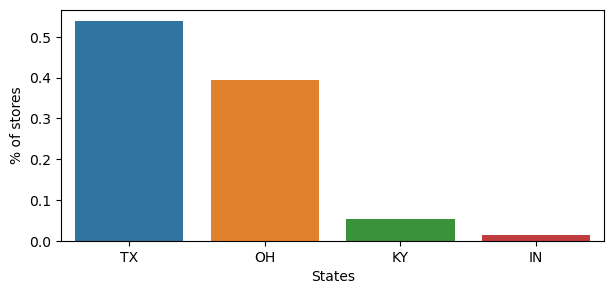

In [61]:
plt.figure(figsize = (7,3), dpi = 100)
sns.barplot(x = store_df['ADDRESS_STATE_PROV_CODE'].value_counts(normalize = True).index, y = store_df['ADDRESS_STATE_PROV_CODE'].value_counts(normalize = True).values)
plt.xlabel('States')
plt.ylabel('% of stores')
plt.show()

In [62]:
store_df['ADDRESS_CITY_NAME'].value_counts()

CINCINNATI         9
HOUSTON            8
MIDDLETOWN         3
COVINGTON          2
SUGAR LAND         2
LOVELAND           2
MAINEVILLE         2
HAMILTON           2
KATY               2
MCKINNEY           2
DAYTON             2
CROWLEY            1
GOSHEN             1
PASADENA           1
WOODLANDS          1
MESQUITE           1
SPRINGFIELD        1
FLOWER MOUND       1
SOUTHLAKE          1
FRISCO             1
WEST CHESTER       1
DENTON             1
CYPRESS            1
LEBANON            1
RICHARDSON         1
GARLAND            1
KETTERING          1
DUNCANVILLE        1
VANDALIA           1
MAGNOLIA           1
BEAUMONT           1
ALLEN              1
MILFORD            1
BLUE ASH           1
CLUTE              1
DICKINSON          1
GRAND PRAIRIE      1
ARLINGTON          1
LAWRENCEBURG       1
ROCKWALL           1
COLLEGE STATION    1
MASON              1
SAINT MARYS        1
KINGWOOD           1
BAYTOWN            1
THE WOODLANDS      1
INDEPENDENCE       1
DALLAS       

We have 76 stores in 51 different cities across 4 different states.
* Texas has 41 stores
* Ohio has 30 stores
* Kentucky has 4 stores and Indiana has only 1 store.
* Cincinnati City has highest (9) number of stores, followed by Houston (8) and then followed by Middletown with 3 stores. Most of the cities apart from these has only 1 store.

In [63]:
pd.DataFrame(store_df.groupby(['ADDRESS_STATE_PROV_CODE', 'ADDRESS_CITY_NAME'])['STORE_ID'].count())

STORE_ID
ADDRESS_STATE_PROV_CODE ADDRESS_CITY_NAME          
IN                      LAWRENCEBURG              1
KY                      COVINGTON                 2
                        ERLANGER                  1
                        INDEPENDENCE              1
OH                      BLUE ASH                  1
                        CINCINNATI                9
                        DAYTON                    2
                        GOSHEN                    1
                        HAMILTON                  2
                        KETTERING                 1
                        LEBANON                   1
                        LOVELAND                  2
                        MAINEVILLE                2
                        MASON                     1
                        MIDDLETOWN                3
                        MILFORD                   1
                        SAINT MARYS               1
                        SPRINGFIELD               1
                        VANDALIA                  1
                        WEST CHESTER              1
TX                      ALLEN                     1
                        ARLINGTON                 1
                        BAYTOWN                   1
                        BEAUMONT                  1
                        CARROLLTON                1
                        CLUTE                     1
                        COLLEGE STATION           1
                        CROWLEY                   1
                        CYPRESS                   1
                        DALLAS                    1
                        DENTON                    1
                        DICKINSON                 1
                        DUNCANVILLE               1
                        FLOWER MOUND              1
                        FRISCO                    1
                        GARLAND                   1
                        GRAND PRAIRIE             1
                        HOUSTON                   8
                        KATY                      2
                        KINGWOOD                  1
                        MAGNOLIA                  1
                        MCKINNEY                  2
                        MESQUITE                  1
                        PASADENA                  1
                        RICHARDSON                1
                        ROCKWALL                  1
                        SHERMAN                   1
                        SOUTHLAKE                 1
                        SUGAR LAND                2
                        THE WOODLANDS             1
                        WOODLANDS                 1

**4. MSA_CODE**

In [64]:
store_df['MSA_CODE'].nunique()

9

In [65]:
store_df['MSA_CODE'].value_counts()

17140    29
26420    21
19100    17
19380     4
17780     1
47540     1
43300     1
13140     1
44220     1
Name: MSA_CODE, dtype: int64

These 76 store locations are categorized into 9 different MSA Zones depending upon their similarities in geography and population density.

**5. PARKING_SPACE_QTY, SALES_AREA_SIZE_NUM**

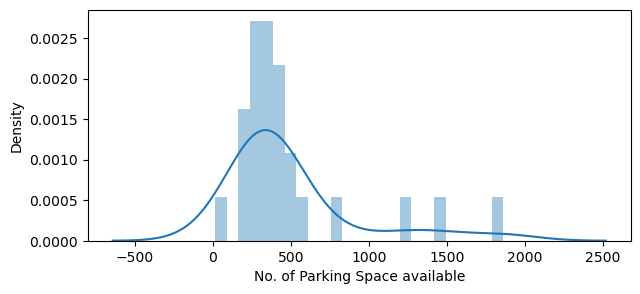

In [66]:
plt.figure(figsize = (7,3), dpi = 100)
sns.distplot(store_df['PARKING_SPACE_QTY'], bins = 25)
plt.xlabel('No. of Parking Space available')
plt.show()

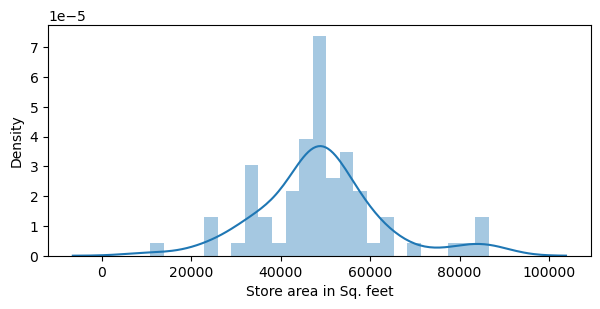

In [67]:
plt.figure(figsize = (7,3), dpi = 100)
sns.distplot(store_df['SALES_AREA_SIZE_NUM'], bins = 25)
plt.xlabel('Store area in Sq. feet')
plt.show()

* Majority of the stores have a parking space of around 500.
* Most of the stores have an operational area within 20000 Sq feet 60000 Sq Feet

**What is the average store size in each state?**

In [68]:
pd.DataFrame(store_df.groupby('ADDRESS_STATE_PROV_CODE')['SALES_AREA_SIZE_NUM'].mean()).sort_values(by = 'SALES_AREA_SIZE_NUM')

,SALES_AREA_SIZE_NUM
ADDRESS_STATE_PROV_CODE,
KY,39855.500000
TX,46920.902439
OH,52691.200000
IN,58563.000000


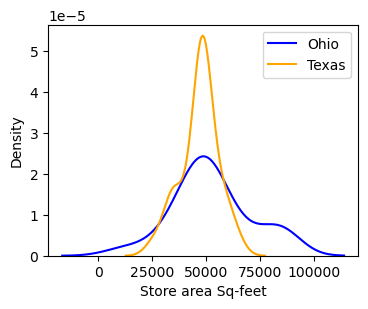

In [69]:
state_oh = store_df[store_df['ADDRESS_STATE_PROV_CODE'] == 'OH']
state_tx = store_df[store_df['ADDRESS_STATE_PROV_CODE'] == 'TX']

plt.figure(figsize = (4,3), dpi = 100)
sns.distplot(state_oh['SALES_AREA_SIZE_NUM'], hist = False, bins = 25, color = 'blue', label = 'Ohio')
sns.distplot(state_tx['SALES_AREA_SIZE_NUM'], hist = False, bins = 25, color = 'orange', label = 'Texas')
plt.xlabel('Store area Sq-feet')
plt.legend()
plt.show()

* Ohio state has store areas of almost all sizes
* Texas has the most number of stores and their operational area is within 25000 to 75000 Sq-feet

**6. AVG_WEEKLY_BASKETS**

In [70]:
store_df['AVG_WEEKLY_BASKETS'].describe()

count       76.000000
mean     24226.921053
std       8863.939362
min      10435.000000
25%      16983.500000
50%      24667.500000
75%      29398.500000
max      54053.000000
Name: AVG_WEEKLY_BASKETS, dtype: float64

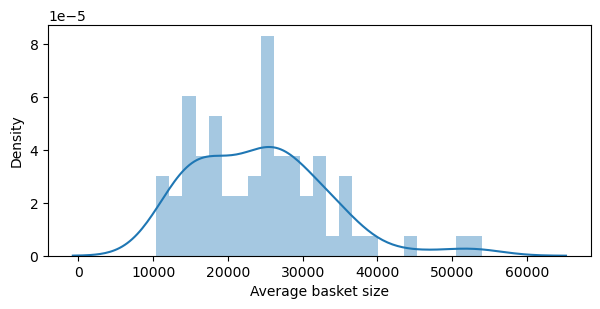

In [71]:
plt.figure(figsize = (7,3), dpi=100)
sns.distplot(store_df['AVG_WEEKLY_BASKETS'], bins = 25)
plt.xlabel('Average basket size')
plt.show()

In [72]:
pd.DataFrame(store_df.groupby('ADDRESS_STATE_PROV_CODE')['AVG_WEEKLY_BASKETS'].mean()).sort_values(by = 'AVG_WEEKLY_BASKETS')

,AVG_WEEKLY_BASKETS
ADDRESS_STATE_PROV_CODE,
IN,19275.000000
KY,21489.000000
TX,23234.195122
OH,26113.766667


* Ohio has the highest average basket size of approx 26113 customers per week.

**7. SEG_VALUE_NAME**

In [73]:
store_df['SEG_VALUE_NAME'].value_counts()

MAINSTREAM    43
VALUE         19
UPSCALE       14
Name: SEG_VALUE_NAME, dtype: int64

There are certain segments assigned to store, based on the brand and quality of products sold at the store.

* **Upscale stores** : Located in high income neighborhoods and offer more high-end product
* **Mainstream stores** : Located in middle class areas, offering a mix of upscale and value product
* **Value stores** : Focus on low prices products targeting low income customers

Let's look at the variations in Store Operational area and Average Basket Size corresponding to each Segment

In [74]:
pd.DataFrame(store_df.groupby('SEG_VALUE_NAME')['SALES_AREA_SIZE_NUM'].mean()).sort_values(by = 'SALES_AREA_SIZE_NUM')

,SALES_AREA_SIZE_NUM
SEG_VALUE_NAME,
VALUE,38706.368421
MAINSTREAM,50075.976744
UPSCALE,59556.428571


In [75]:
pd.DataFrame(store_df.groupby('SEG_VALUE_NAME')['AVG_WEEKLY_BASKETS'].mean()).sort_values(by = 'AVG_WEEKLY_BASKETS')

,AVG_WEEKLY_BASKETS
SEG_VALUE_NAME,
VALUE,21363.526316
MAINSTREAM,24024.093023
UPSCALE,28735.928571


As anticipated, Value stores have the lowest operational areas and a lower number of weekly baskets, while UPSCALE stores are the ones with highest store area and basket size as bigger stores tend to have a higher foot-fall.

## 2. Data-Exploration (Bi-variate Analysis)- train_df, product_df, store_df

Let's merge all the available tables to generate a consolidated dataframe which describes all the variables for a particular item sold. We will call this **store_product_df**.

In [76]:
store_product_df = train_df.merge(product_df, how = 'left', on='UPC')
store_product_df = store_product_df.merge(store_df, how = 'left', left_on = 'STORE_NUM', right_on = 'STORE_ID')

We will also generate two new features from the Datetime column:
1. WEEK_OF_YEAR: representing the week of year when the sale was recorded.
2. MONTH: The month corresponding to the particular sales record.

In [77]:
store_product_df['WEEK_OF_YEAR'] = store_product_df['WEEK_END_DATE'].dt.weekofyear
store_product_df['MONTH'] = store_product_df['WEEK_END_DATE'].dt.month

In [78]:
store_product_df.head()

,WEEK_END_DATE,STORE_NUM,UPC,PRICE,BASE_PRICE,FEATURE,DISPLAY,UNITS,DESCRIPTION,MANUFACTURER,...,STORE_NAME,ADDRESS_CITY_NAME,ADDRESS_STATE_PROV_CODE,MSA_CODE,SEG_VALUE_NAME,PARKING_SPACE_QTY,SALES_AREA_SIZE_NUM,AVG_WEEKLY_BASKETS,WEEK_OF_YEAR,MONTH
0,2009-01-14,367,1111009477,1.39,1.57,0,0,13,PL MINI TWIST PRETZELS,PRIVATE LABEL,...,15TH & MADISON,COVINGTON,KY,17140,VALUE,196.0,24721,12707,3,1
1,2009-01-14,367,1111009497,1.39,1.39,0,0,20,PL PRETZEL STICKS,PRIVATE LABEL,...,15TH & MADISON,COVINGTON,KY,17140,VALUE,196.0,24721,12707,3,1
2,2009-01-14,367,1111085319,1.88,1.88,0,0,14,PL HONEY NUT TOASTD OATS,PRIVATE LABEL,...,15TH & MADISON,COVINGTON,KY,17140,VALUE,196.0,24721,12707,3,1
3,2009-01-14,367,1111085345,1.88,1.88,0,0,29,PL RAISIN BRAN,PRIVATE LABEL,...,15TH & MADISON,COVINGTON,KY,17140,VALUE,196.0,24721,12707,3,1
4,2009-01-14,367,1111085350,1.98,1.98,0,0,35,PL BT SZ FRSTD SHRD WHT,PRIVATE LABEL,...,15TH & MADISON,COVINGTON,KY,17140,VALUE,196.0,24721,12707,3,1


We have 24 variables corresponding to each sales data-point. Let's check all the data-types

In [79]:
store_product_df.dtypes

WEEK_END_DATE              datetime64[ns]
STORE_NUM                           int64
UPC                                 int64
PRICE                             float64
BASE_PRICE                        float64
FEATURE                             int64
DISPLAY                             int64
UNITS                               int64
DESCRIPTION                        object
MANUFACTURER                       object
CATEGORY                           object
SUB_CATEGORY                       object
PRODUCT_SIZE                       object
STORE_ID                            int64
STORE_NAME                         object
ADDRESS_CITY_NAME                  object
ADDRESS_STATE_PROV_CODE            object
MSA_CODE                            int64
SEG_VALUE_NAME                     object
PARKING_SPACE_QTY                 float64
SALES_AREA_SIZE_NUM                 int64
AVG_WEEKLY_BASKETS                  int64
WEEK_OF_YEAR                        int64
MONTH                             

**1. WEEK_END_DATE V/S UNITS**

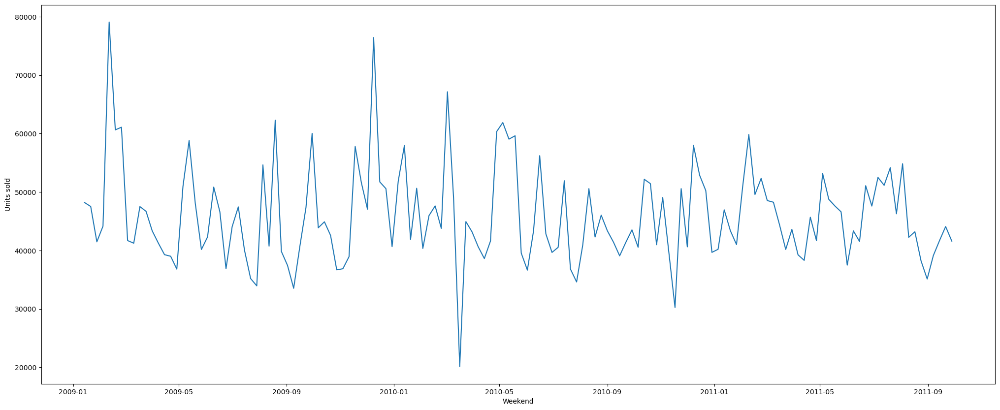

In [80]:
weekend_demand = store_product_df.groupby('WEEK_END_DATE')['UNITS'].sum()

plt.figure(figsize = (25,10))
sns.lineplot(x = weekend_demand.index, y = weekend_demand.values)
plt.xlabel('Weekend')
plt.ylabel('Units sold')
plt.show()

* Highest No. of Units sold in a week across all the stores is close to 80000 and lowest is close to 20000.
* There's no significant seasonality observed over a span of 142 weeks.

**1. WEEK_OF_YEAR V/S UNITS and MONTH V/S UNITS**

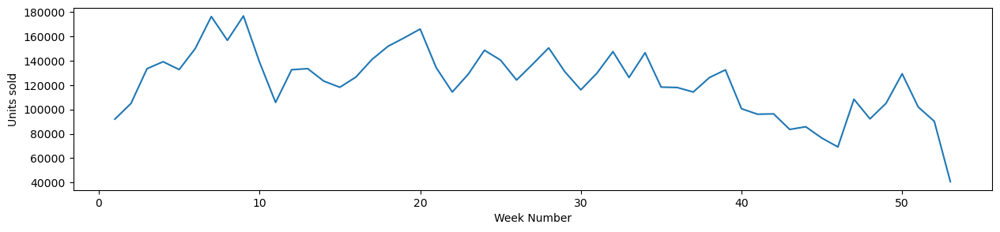

In [81]:
weekly_demand = store_product_df.groupby('WEEK_OF_YEAR')['UNITS'].sum()

plt.figure(figsize = (15, 3), dpi = 100)
sns.lineplot(x = weekly_demand.index, y = weekly_demand.values)
plt.xlabel('Week Number')
plt.ylabel('Units sold')
plt.show()

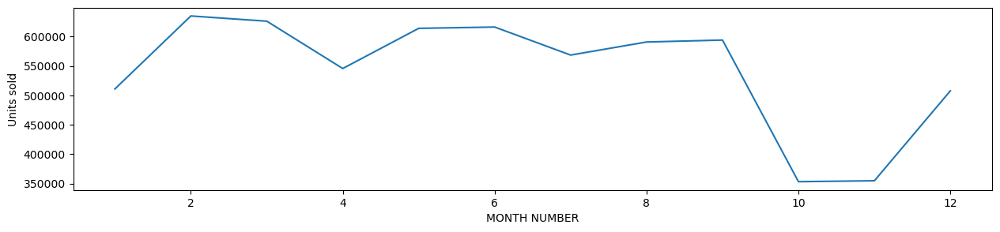

In [82]:
monthly_demand = store_product_df.groupby('MONTH')['UNITS'].sum()

plt.figure(figsize = (15, 3), dpi = 100)
sns.lineplot(x = monthly_demand.index, y = monthly_demand.values)
plt.xlabel('MONTH NUMBER')
plt.ylabel('Units sold')
plt.show()

We see, around February the demand is at its peak. With a slight drop it observes almost a stagnent curve for rest of the year but towards 10th month or more precisely 45th-46th week of the year it drops significantly and again at the end of the year it starts picking up.

**2. CATEGORY V/S UNITS**

In [83]:
category_demand = pd.DataFrame(store_product_df.groupby('CATEGORY')['UNITS'].sum()).sort_values(by = 'UNITS', ascending = False)
category_demand['PERCENTAGE'] = category_demand['UNITS'].apply(lambda x: x/category_demand['UNITS'].sum())*100
category_demand

,UNITS,PERCENTAGE
CATEGORY,,
COLD CEREAL,3753981,57.587065
BAG SNACKS,1676744,25.721698
FROZEN PIZZA,936688,14.369043
ORAL HYGIENE PRODUCTS,151379,2.322194


Most sold category among all is Cold Cereal which comprises more than 57% of the total sales. The reason for it might be the cheaper prices of cereals as compared to rest of the two Edible categories (Pretzels and Pizza). 

* This still doesn't give a granular insight into the demand of category. So now, we're going to check the weekly demand trend of each product belonging to a specific category. Earlier we had:
1. 9 types of Cold Cereals
2. 8 types of Bag Snacks
3. 7 kinds of Frozen Pizzas
4. 6 types of Mouthwashes

In [84]:
# Function to plot weekly sales of each product in a specific category
def category_plot(product_list):
    
    # Defining a dictionary storing UPCs and each UPC's corresponding weekly sales for all 142 weeks
    d = {product: store_product_df[store_product_df['UPC'] == product].groupby('WEEK_END_DATE')['UNITS'].sum() for product in product_list}
    
    # Creating a subplot that will consist as many plots as the number of UPCs
    fig, axs = plt.subplots(len(product_list), 1, figsize= (20,20), dpi = 300)
    j = 0
    
    for product in d.keys():
        # Adding manufacturer and description to the title for each UPC 
        manu = store_product_df[store_product_df['UPC'] == product]['MANUFACTURER'].values[0]
        desc = store_product_df[store_product_df['UPC'] == product]['DESCRIPTION'].values[0]
        
        # Actual Plotting
        sns.lineplot(x = d[product].index, y = d[product], ax = axs[j]).set_title(str(manu)+str(" ")+str(desc), y=0.75, fontsize = 16)
        j = j+1
    plt.tight_layout()

In [85]:
# creating list of products based on category
pretzels = set(product_df[product_df['CATEGORY'] == 'BAG SNACKS']['UPC'])
frozen_pizza = set(product_df[product_df['CATEGORY'] == 'FROZEN PIZZA']['UPC'])
oral_hygiene = set(product_df[product_df['CATEGORY'] == 'ORAL HYGIENE PRODUCTS']['UPC'])
cold_cereal = set(product_df[product_df['CATEGORY'] == 'COLD CEREAL']['UPC'])

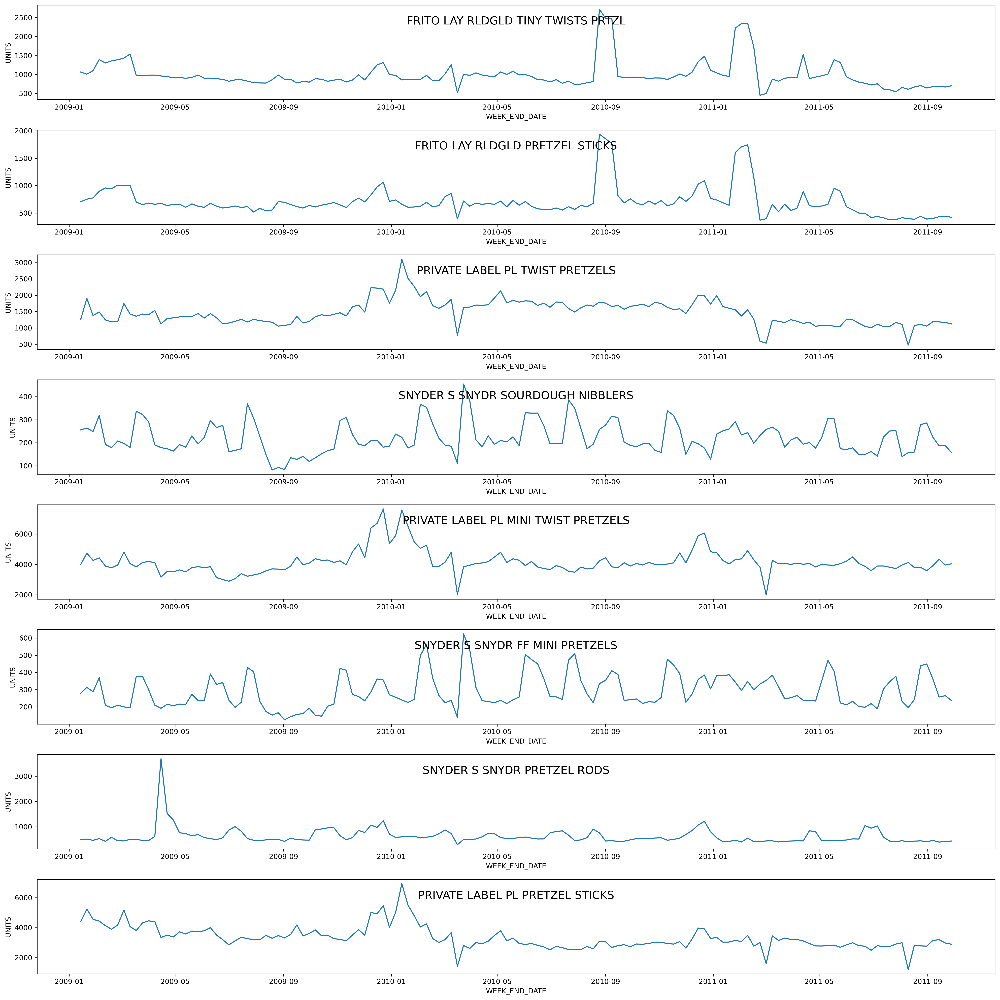

In [86]:
category_plot(pretzels)

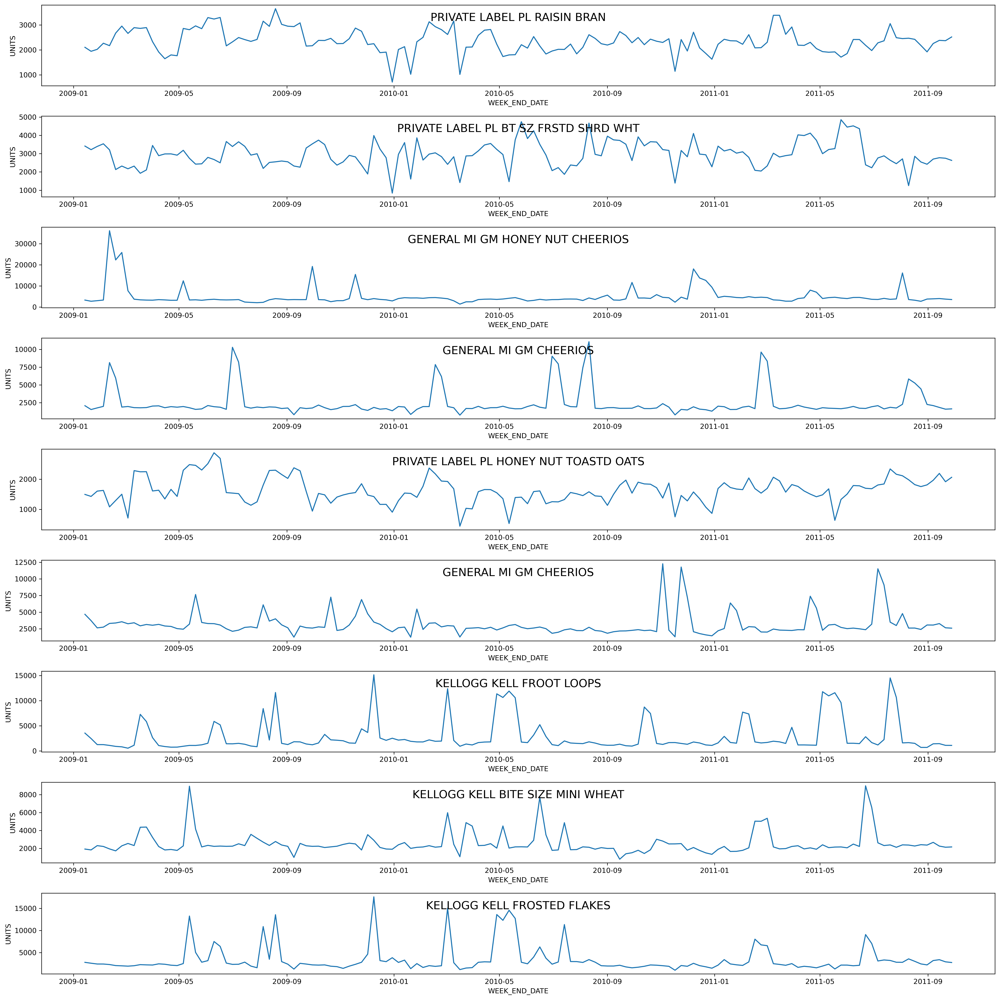

In [87]:
category_plot(cold_cereal)

* No increasing/decreasing trend for the sale of products over time
* No seasonal patterns seen on individual product sale
* Products by same manufaturer have similar patterns (spikes and drops).

**3. STORE_ID V/S UNITS**

In [88]:
stores_list = random.sample(list(store_product_df['STORE_ID']), 5)

In [89]:
d = {store: store_product_df[store_product_df['STORE_ID'] == store].groupby('WEEK_END_DATE')['UNITS'].sum() for store in stores_list}

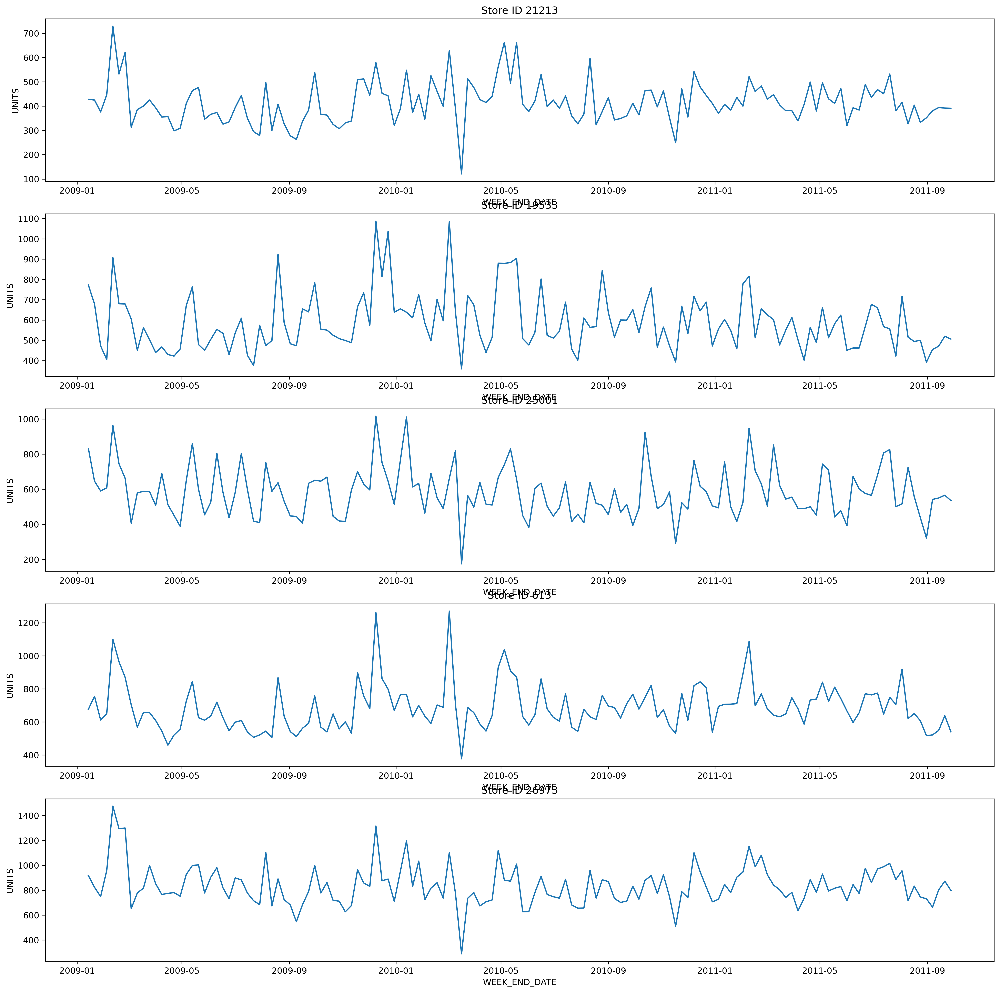

In [90]:
fig, axs = plt.subplots(len(stores_list), 1, figsize = (20,20), dpi = 300)
j = 0

for store in d.keys():
    sns.lineplot(x = d[store].index, y = d[store], ax = axs[j]).set_title('Store ID {}'.format(store))
    j = j+1

For the randomly selected store numbers, we can see that there is no pattern in the plot. The same was repeated for a number of stores and the data showed no increasing or decreasing trend or seasonality.

**4. FEATURED V/S UNITS AND DISPLAY V/S UNITS**

When the products are in Featured list or are at the Promotional Display, it's expected that the product sales will increase. Let's check this for a set of products.

In [91]:
def featured_plot(product_list):
    
    # Defining dictionaries to store values of weekly feature status and weekly sales number for each UPC
    d_f = {product: 1000*store_product_df[store_product_df['UPC'] == product].groupby('WEEK_END_DATE')['FEATURE'].mean() for product in product_list}
    d = {product: store_product_df[store_product_df['UPC'] == product].groupby('WEEK_END_DATE')['UNITS'].sum() for product in product_list}
    
    fig, axs = plt.subplots(len(product_list), 1, figsize = (20, 20), dpi=300)
    j = 0
    for product in d.keys():
        # Manufacturer name and Descritption in title
        manu = store_product_df[store_product_df['UPC'] == product]['MANUFACTURER'].values[0]
        desc = store_product_df[store_product_df['UPC'] == product]['DESCRIPTION'].values[0]
        
        # plotting featured and sales values
        sns.lineplot(x = d_f[product].index, y = d_f[product],ax = axs[j], color = 'red').set_title(str(manu)+str(" ")+str(desc), y=0.75, fontsize = 16)
        sns.lineplot(x = d[product].index, y = d[product],ax = axs[j], color = 'blue').set_title(str(manu)+str(" ")+str(desc), y=0.75, fontsize = 16)
        j = j+1

In [92]:
product_list_f = set(store_product_df[store_product_df['CATEGORY'] == 'BAG SNACKS']['UPC'])

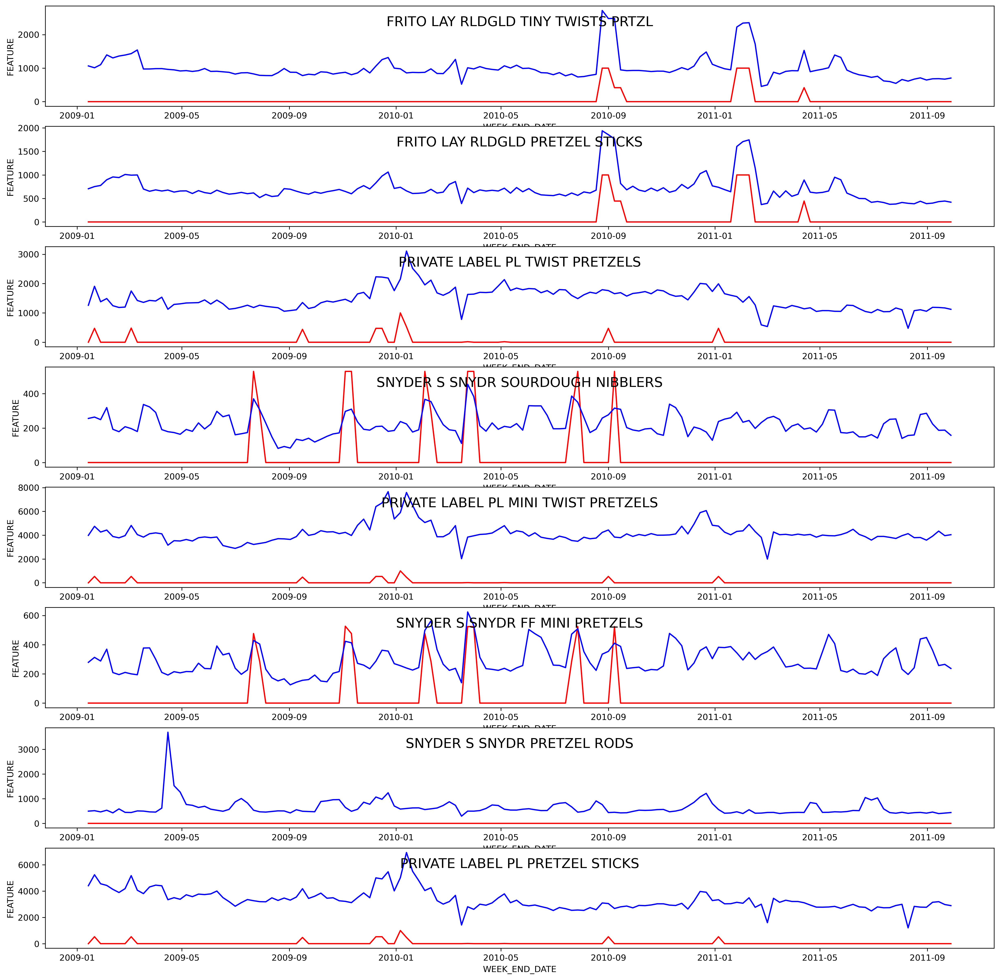

In [93]:
featured_plot(product_list_f)

We see that whenever is product is featured in the promotional offer list, the sales have increased

In [94]:
def display_plot(product_list):
    
    # Defining dictionaries to store values of weekly feature status and weekly sales number for each UPC
    d_f = {product: 1000*store_product_df[store_product_df['UPC'] == product].groupby('WEEK_END_DATE')['DISPLAY'].mean() for product in product_list}
    d = {product: store_product_df[store_product_df['UPC'] == product].groupby('WEEK_END_DATE')['UNITS'].sum() for product in product_list}
    
    fig, axs = plt.subplots(len(product_list), 1, figsize = (20, 20), dpi=300)
    j = 0
    for product in d.keys():
        # Manufacturer name and Descritption in title
        manu = store_product_df[store_product_df['UPC'] == product]['MANUFACTURER'].values[0]
        desc = store_product_df[store_product_df['UPC'] == product]['DESCRIPTION'].values[0]
        
        # plotting featured and sales values
        sns.lineplot(x = d_f[product].index, y = d_f[product],ax = axs[j], color = 'red').set_title(str(manu)+str(" ")+str(desc), y=0.75, fontsize = 16)
        sns.lineplot(x = d[product].index, y = d[product],ax = axs[j], color = 'blue').set_title(str(manu)+str(" ")+str(desc), y=0.75, fontsize = 16)
        j = j+1

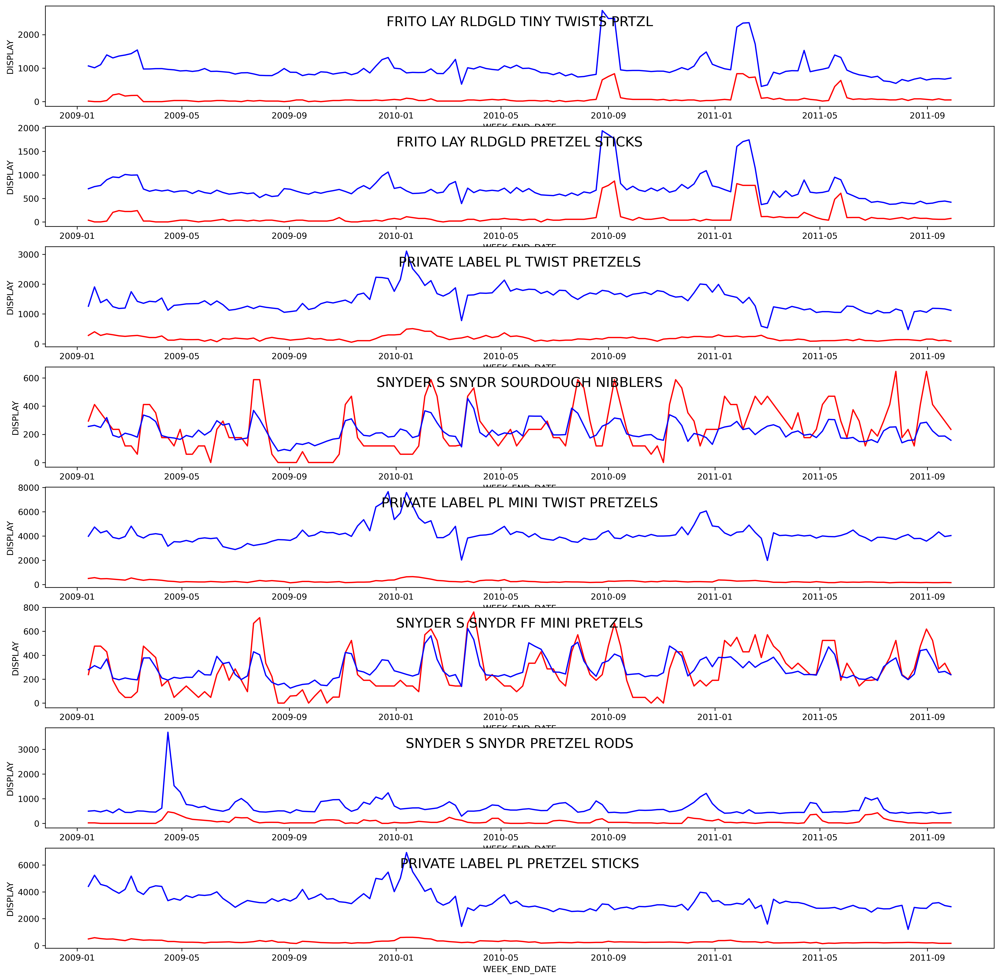

In [95]:
display_plot(product_list_f)

* It is evident that product sales are greatly affected by the display.
* For products on display, the sales are higher

**5. BASE_PRICE V/S UNITS**

We can expect a higher sales for the products that have a lower price in the same category

In [96]:
product_size_coldcereal = store_product_df[store_product_df['CATEGORY']=='COLD CEREAL']
product_size_bagsnacks  = store_product_df[store_product_df['CATEGORY']=='BAG SNACKS']
product_size_frozenpizza = store_product_df[store_product_df['CATEGORY']=='FROZEN PIZZA']
product_size_oralhygiene = store_product_df[store_product_df['CATEGORY']=='ORAL HYGIENE PRODUCTS']

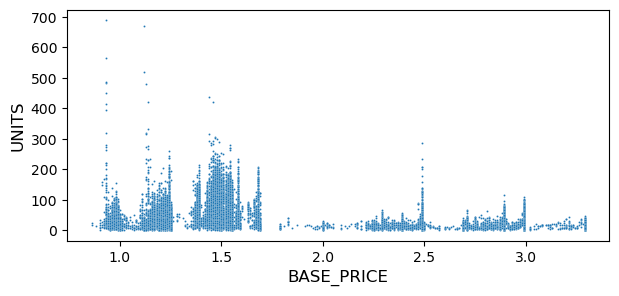

In [97]:
# scatter plot for base price and sales
plt.figure(figsize=(7,3))
sns.scatterplot(x = product_size_bagsnacks['BASE_PRICE'], y = product_size_bagsnacks['UNITS'], s=2)
plt.xlabel('BASE_PRICE', fontsize=12)
plt.ylabel('UNITS', fontsize=12)
plt.show()

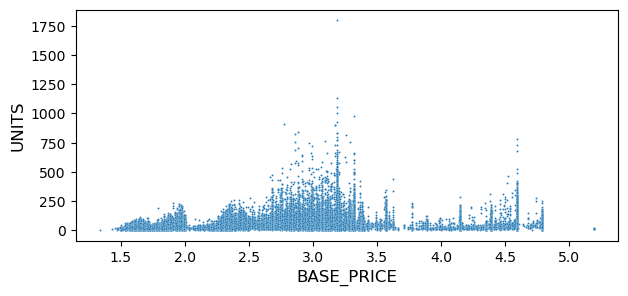

In [98]:
# scatter plot for base price and sales
plt.figure(figsize=(7,3))
sns.scatterplot(x = product_size_coldcereal['BASE_PRICE'], y = product_size_coldcereal['UNITS'], s=2)
plt.xlabel('BASE_PRICE', fontsize=12)
plt.ylabel('UNITS', fontsize=12)
plt.show()

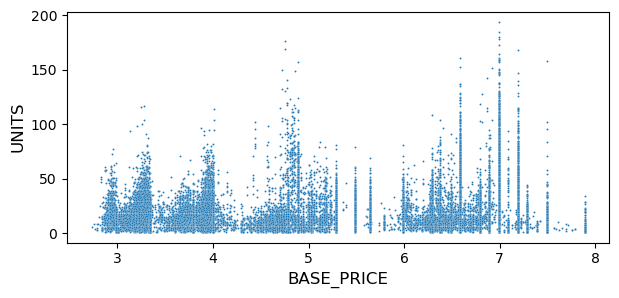

In [99]:
# scatter plot for base price and sales
plt.figure(figsize=(7,3))
sns.scatterplot(x = product_size_frozenpizza['BASE_PRICE'], y = product_size_frozenpizza['UNITS'], s=2)
plt.xlabel('BASE_PRICE', fontsize=12)
plt.ylabel('UNITS', fontsize=12)
plt.show()

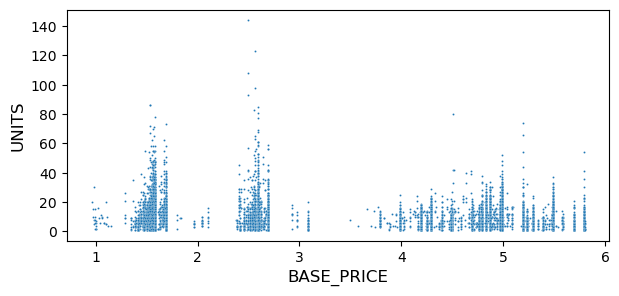

In [100]:
# scatter plot for base price and sales
plt.figure(figsize=(7,3))
sns.scatterplot(x = product_size_oralhygiene['BASE_PRICE'], y = product_size_oralhygiene['UNITS'], s=2)
plt.xlabel('BASE_PRICE', fontsize=12)
plt.ylabel('UNITS', fontsize=12)
plt.show()

* For bag snacks and oral hygiene category, items with lower price show a higher sale.
* Frozen pizza items have higher sale for higher price items.
* Sales of the cold cereal category for moderate price range is highest.

**6. PRODUCT_SIZE V/S UNITS**

In [101]:
pd.crosstab(product_size_coldcereal['CATEGORY'], product_size_coldcereal['PRODUCT_SIZE'])

PRODUCT_SIZE,12 OZ,12.2 OZ,12.25 OZ,15 OZ,18 OZ,20 OZ
CATEGORY,,,,,,
COLD CEREAL,10786,10766,21426,10785,32203,10789


In [102]:
pd.crosstab(product_size_frozenpizza['CATEGORY'], product_size_frozenpizza['PRODUCT_SIZE'])

PRODUCT_SIZE,22.7 OZ,28.3 OZ,29.6 OZ,29.8 OZ,30.5 OZ,32.7 OZ
CATEGORY,,,,,,
FROZEN PIZZA,3641,10767,9989,9126,8131,18743


In [103]:
pd.crosstab(product_size_bagsnacks['CATEGORY'], product_size_bagsnacks['PRODUCT_SIZE'])

PRODUCT_SIZE,10 OZ,15 OZ,16 OZ
CATEGORY,,,
BAG SNACKS,6916,28921,21443


In [104]:
pd.crosstab(product_size_oralhygiene['CATEGORY'], product_size_oralhygiene['PRODUCT_SIZE'])

PRODUCT_SIZE,1 LT,500 ML
CATEGORY,,
ORAL HYGIENE PRODUCTS,7926,9928


We can see people prefer to buy products in larger sizes since it's more economical

**7. MANUFACTURER V/S UNITS**

In [105]:
pretzels = list(product_df[product_df['CATEGORY'] == 'BAG SNACKS']['UPC'])
frozen_pizza = list(product_df[product_df['CATEGORY'] == 'FROZEN PIZZA']['UPC'])
oral_hygiene = list(product_df[product_df['CATEGORY'] == 'ORAL HYGIENE PRODUCTS']['UPC'])
cold_cereal = list(product_df[product_df['CATEGORY'] == 'COLD CEREAL']['UPC'])

,UPC,DESCRIPTION,MANUFACTURER,CATEGORY,SUB_CATEGORY,PRODUCT_SIZE
0,1111009477,PL MINI TWIST PRETZELS,PRIVATE LABEL,BAG SNACKS,PRETZELS,15 OZ
1,1111009497,PL PRETZEL STICKS,PRIVATE LABEL,BAG SNACKS,PRETZELS,15 OZ
2,1111009507,PL TWIST PRETZELS,PRIVATE LABEL,BAG SNACKS,PRETZELS,15 OZ
14,2840004768,RLDGLD TINY TWISTS PRTZL,FRITO LAY,BAG SNACKS,PRETZELS,16 OZ
15,2840004770,RLDGLD PRETZEL STICKS,FRITO LAY,BAG SNACKS,PRETZELS,16 OZ
25,7797502248,SNYDR PRETZEL RODS,SNYDER S,BAG SNACKS,PRETZELS,10 OZ
26,7797508004,SNYDR SOURDOUGH NIBBLERS,SNYDER S,BAG SNACKS,PRETZELS,16 OZ
27,7797508006,SNYDR FF MINI PRETZELS,SNYDER S,BAG SNACKS,PRETZELS,16 OZ


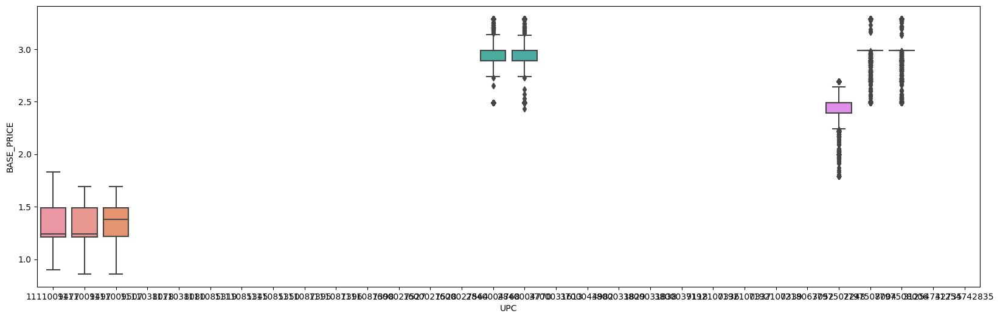

In [106]:
plt.figure(figsize=(20,6))
ax = sns.boxplot(x="UPC", y="BASE_PRICE", data= train_df[train_df['UPC'].isin(pretzels)])
product_df[product_df['UPC'].isin(pretzels)]

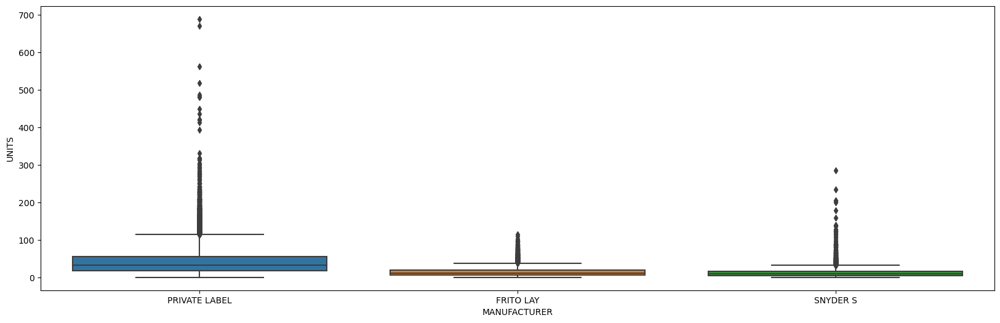

In [107]:
plt.figure(figsize=(20,6))
ax = sns.boxplot(x="MANUFACTURER", y="UNITS", data=store_product_df[store_product_df['UPC'].isin(pretzels)])

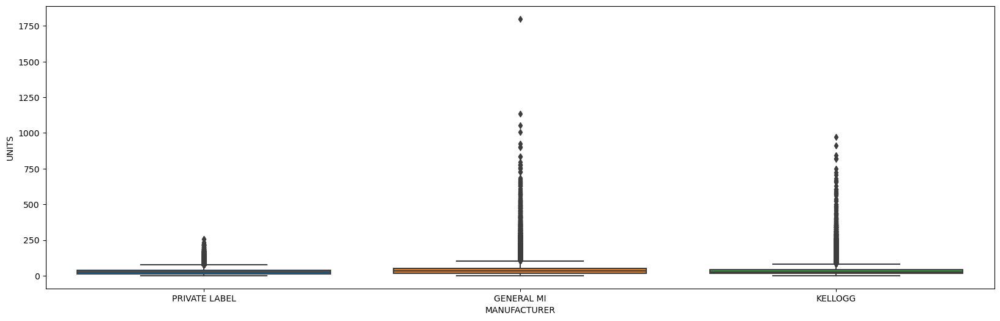

In [108]:
plt.figure(figsize=(20,6))
ax = sns.boxplot(x="MANUFACTURER", y="UNITS", data=store_product_df[store_product_df['UPC'].isin(cold_cereal)])

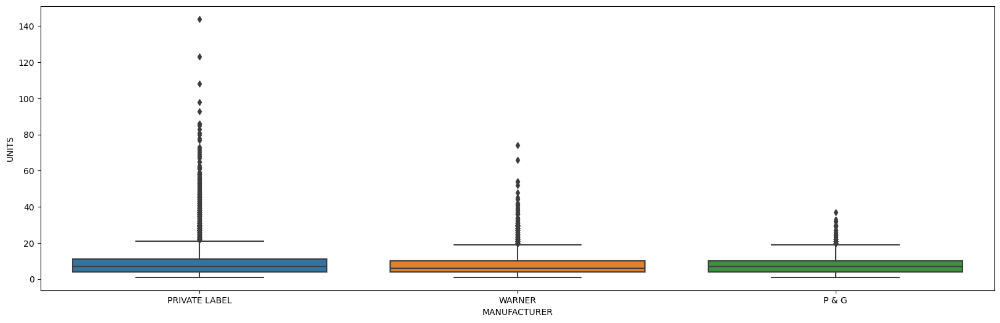

In [109]:
plt.figure(figsize=(20,6))
ax = sns.boxplot(x="MANUFACTURER", y="UNITS", data=store_product_df[store_product_df['UPC'].isin(oral_hygiene)])

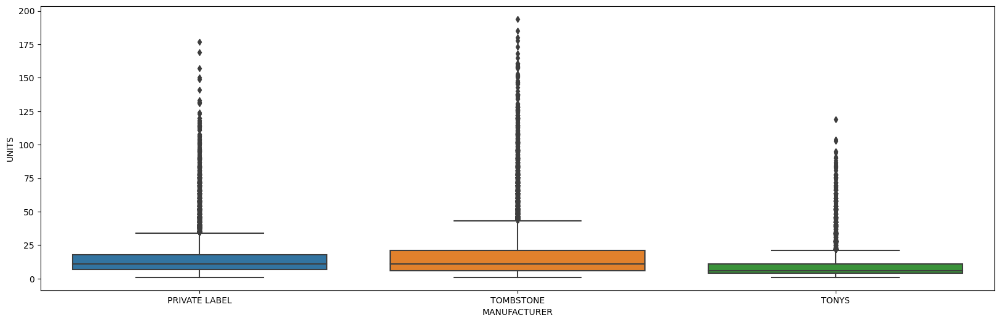

In [110]:
plt.figure(figsize=(20,6))
ax = sns.boxplot(x="MANUFACTURER", y="UNITS", data=store_product_df[store_product_df['UPC'].isin(frozen_pizza)])

**8. Units for Stores in Different States**

* Store Location: Stores in a particular state/city will have a similar trend

In [111]:
grouped_weekly_sales = store_product_df.groupby(['WEEK_END_DATE','STORE_NUM'])['UNITS'].sum().reset_index()

grouped_weekly_sales = grouped_weekly_sales.merge(store_df, how = 'left', left_on = 'STORE_NUM', right_on = 'STORE_ID')

grouped_weekly_sales = grouped_weekly_sales.sort_values(by = 'ADDRESS_STATE_PROV_CODE')

In [112]:
state = (store_df[['ADDRESS_STATE_PROV_CODE','STORE_ID']].sort_values(by ='ADDRESS_STATE_PROV_CODE'))['STORE_ID']

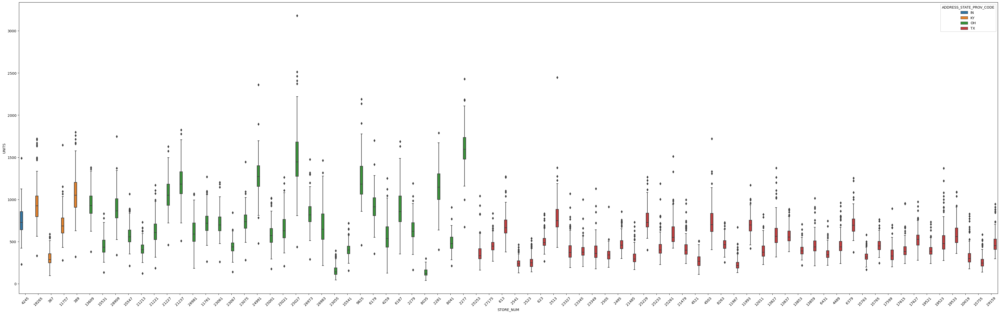

In [113]:
plt.figure(figsize=(50,15))

ax=sns.boxplot(x="STORE_NUM",y="UNITS",data=grouped_weekly_sales, hue ='ADDRESS_STATE_PROV_CODE', order =state)
plt.xticks(rotation=45)
plt.show()

* The most frequent colors we see are green and red - Ohio and Texas
* Mostly the number of units is higher for Ohio (considering individual stores)

**9. STORE_SIZE and UNITS**
* Size of Store: Stores with larger area would have more sales

In [114]:
store_agg_data = train_df.groupby(['STORE_NUM'])['UNITS'].sum().reset_index()
merged_store_data = store_df.merge(store_agg_data, how = 'left', left_on = 'STORE_ID', right_on = 'STORE_NUM')

In [115]:
merged_store_data.head()

,STORE_ID,STORE_NAME,ADDRESS_CITY_NAME,ADDRESS_STATE_PROV_CODE,MSA_CODE,SEG_VALUE_NAME,PARKING_SPACE_QTY,SALES_AREA_SIZE_NUM,AVG_WEEKLY_BASKETS,STORE_NUM,UNITS
0,367,15TH & MADISON,COVINGTON,KY,17140,VALUE,196.0,24721,12707,367,43310
1,389,SILVERLAKE,ERLANGER,KY,17140,MAINSTREAM,408.0,46073,24767,389,151796
2,613,EAST ALLEN,ALLEN,TX,19100,MAINSTREAM,464.0,64926,29386,613,97741
3,623,HOUSTON,HOUSTON,TX,26420,MAINSTREAM,NaN,46930,36741,623,71753
4,2277,ANDERSON TOWNE CTR,CINCINNATI,OH,17140,UPSCALE,NaN,81958,54053,2277,229575


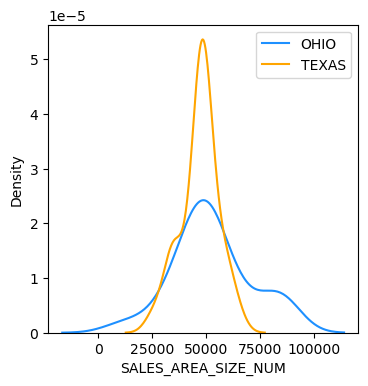

In [116]:
plt.figure(figsize = (4,4), dpi = 100)
state_oh = merged_store_data.loc[merged_store_data['ADDRESS_STATE_PROV_CODE'] == 'OH']
state_tx = merged_store_data.loc[merged_store_data['ADDRESS_STATE_PROV_CODE'] == 'TX']

sns.distplot(state_oh['SALES_AREA_SIZE_NUM'], hist=False,color= 'dodgerblue', label= 'OHIO')
sns.distplot(state_tx['SALES_AREA_SIZE_NUM'], hist=False,  color= 'orange', label= 'TEXAS')
plt.legend()
plt.show()

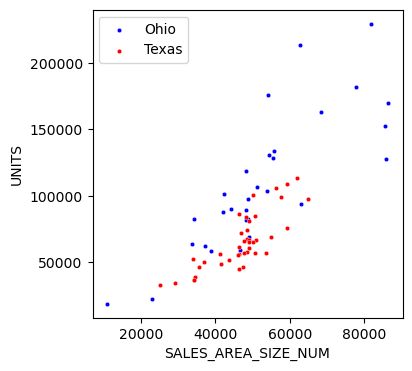

In [117]:
plt.figure(figsize = (4,4), dpi=100)
sns.scatterplot(x = (state_oh['SALES_AREA_SIZE_NUM']), y = (state_oh['UNITS']), color = 'blue', s=10, label = 'Ohio')
sns.scatterplot(x = (state_tx['SALES_AREA_SIZE_NUM']), y = (state_tx['UNITS']), color = 'red', s=10, label = 'Texas')
plt.legend()
plt.show()